In [1]:
%pip install descartes osmnx pandas numpy shapely geopandas

Note: you may need to restart the kernel to use updated packages.


In [2]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)
from pprint import pprint
import osmnx as ox
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.axes._axes import _log as matplotlib_axes_logger
matplotlib_axes_logger.setLevel('ERROR')
from shapely.geometry import Point
import pandas as pd
import numpy as np
import geopandas as gpd
from matplotlib import colors as colors
from matplotlib import colorbar 
from functools import partial
from IPython.display import display, IFrame, Image, SVG
from dataclasses import dataclass
from collections import Counter
from typing import List
# https://gist.github.com/dm-wyncode/55823165c104717ca49863fc526d1354
"""Embed a YouTube video via its embed url into a notebook."""

def _iframe_attrs(embed_url, width=560, height=315):
    """Get IFrame args."""
    return (
        ('src', 'width', 'height'), 
        (embed_url, width, height, ),
    )

def _get_args(embed_url):
    """Get args for type to create a class."""
    iframe = dict(zip(*_iframe_attrs(embed_url)))
    attrs = {
        'display': partial(display, IFrame(**iframe)),
    }
    return ('YouTubeVideo', (object, ), attrs, )



def youtube_video(vid):
    """Embed YouTube video into a notebook.

    Place this module into the same directory as the notebook.

    >>> from embed import youtube_video
    >>> youtube_video(vid).display()
    """
    embed_url = f'https://www.youtube.com/embed/{vid}?rel=0&amp;controls=0&amp;showinfo=0'
    YouTubeVideo = type(*_get_args(embed_url)) # make a class
    return YouTubeVideo() # return an object


cmap=plt.cm.get_cmap('jet')

points = {
    'belfast':(54.5973, -5.9301),
    'nyc': (40.75016359753372, -73.98555060240757),
    'dublin':(53.3498, -6.2603),
    'napa':(38.294073,-122.2951242)
}
dist = 2000 # metres 
figsize = (20,12)
seed = 1024

np.random.seed(seed)

%matplotlib inline

mpl.rcParams['figure.figsize'] = figsize
plt.rcParams['figure.figsize'] = figsize
plt.xkcd()


at = {
    'home':(54.57799,-5.92358),
    'belfast':(54.5973, -5.9301),
    'farset': (54.592789, -5.940715)
}

# Introduction to Geospatial Graph Networks with OSMNX

👋
* Head of Data Science @ WhiteHat Security
* Trustee/Tresurer @ Farset Labs

## Agenda

* What is a Graph?
* What is Open Street Map
* What is OSMNX?

## What is a [Graph](https://en.wikipedia.org/wiki/Graph_(discrete_mathematics))?

![](https://upload.wikimedia.org/wikipedia/commons/thumb/5/5b/6n-graf.svg/333px-6n-graf.svg.png)

> a structure amounting to a set of objects [vertices] in which some pairs of the objects are in some sense "related" [joined by edges]

Basically; $G=(V,E)$

For the above graph; $V = \{1,2,3,4,5,6\}$, and $E = \{\{1, 2\}, \{1, 5\}, \{2, 3\}, \{2, 5\}, \{3, 4\}, \{4, 5\}, \{4, 6\}\}$

## What can you do with Graphs?

Represent pretty much anything you like;
* Package Dependencies
* Function Calls
* Social Networks
* Biological Systems (protein interactions)

Assuming that your Vertices can store attributes

## How are graphs represented?

Adjacency Matrix! Row/Column corresponding to the 'index of the node'

$$\begin{bmatrix}
  0.00 &  0.00 &  1.00 &  1.00 &  0.00 &  0.00 &  1.00\\
  1.00 &  0.00 &  0.00 &  0.00 &  0.00 &  0.00 &  0.00\\
  1.00 &  0.00 &  0.00 &  0.00 &  0.00 &  0.00 &  0.00\\
  0.00 &  1.00 &  0.00 &  0.00 &  0.00 &  1.00 &  0.00\\
  1.00 &  0.00 &  0.00 &  0.00 &  0.00 &  0.00 &  0.00\\
  1.00 &  0.00 &  0.00 &  0.00 &  0.00 &  0.00 &  0.00\\
  1.00 &  0.00 &  0.00 &  0.00 &  0.00 &  0.00 &  0.00
\end{bmatrix}
$$

## What can you do with Graphs in Python

Shockingly little, on your own...

In [3]:
@dataclass
class Node:
    id: str

@dataclass
class Edge:
    a: Node
    b: Node

@dataclass
class Graph:
    vertices: List[Node]
    edges: List[Edge]

In [4]:
nodes = [Node(id) for id in range(1,7)]

edge_indexes = [(1,2),(1,5),(2,3),(2,5),(3,4),(4,5),(4,6)]

edges = [Edge(nodes[a-1],nodes[b-1]) for a,b in edge_indexes]

Graph(nodes,edges)

Graph(vertices=[Node(id=1), Node(id=2), Node(id=3), Node(id=4), Node(id=5), Node(id=6)], edges=[Edge(a=Node(id=1), b=Node(id=2)), Edge(a=Node(id=1), b=Node(id=5)), Edge(a=Node(id=2), b=Node(id=3)), Edge(a=Node(id=2), b=Node(id=5)), Edge(a=Node(id=3), b=Node(id=4)), Edge(a=Node(id=4), b=Node(id=5)), Edge(a=Node(id=4), b=Node(id=6))])

## There must be a better way
![[NetworkX](https://networkx.org/documentation/stable/)](https://networkx.org/documentation/stable/_static/networkx_banner.svg)

In [5]:
import networkx as nx
G = nx.Graph()
G.add_edges_from([(1,2),(1,5),(2,3),(2,5),(3,4),(4,5),(4,6)])
G

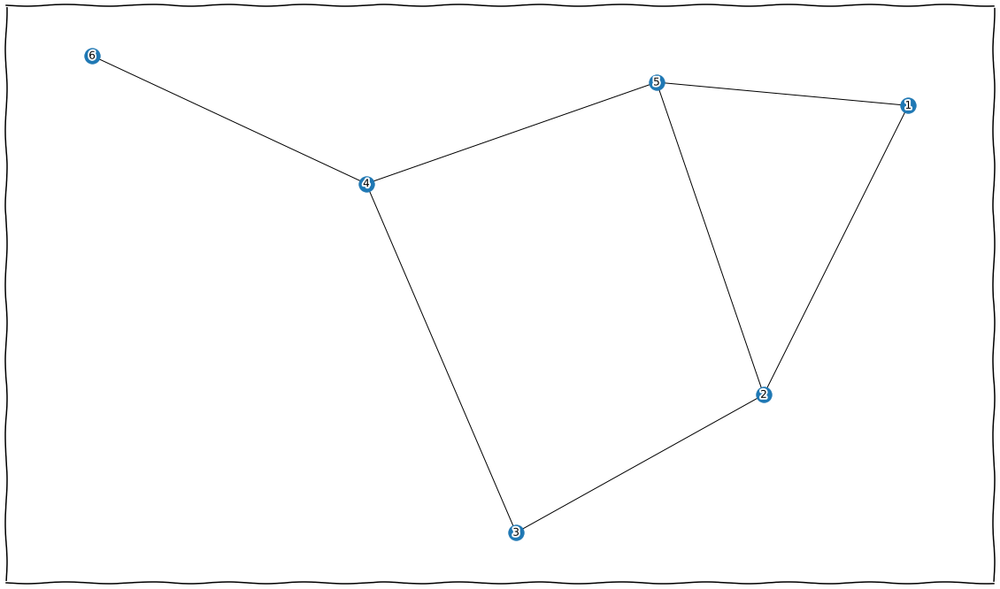

In [6]:
nx.draw_networkx(G)

### Factoid; Graph nodes don't have inherant 'positions'
NetworkX does it's best to 'jiggle the nodes around' to fit in a particular space, so the final output is non-deterministic in simple graphs. 

These can be fixed with a set seed via layout functions

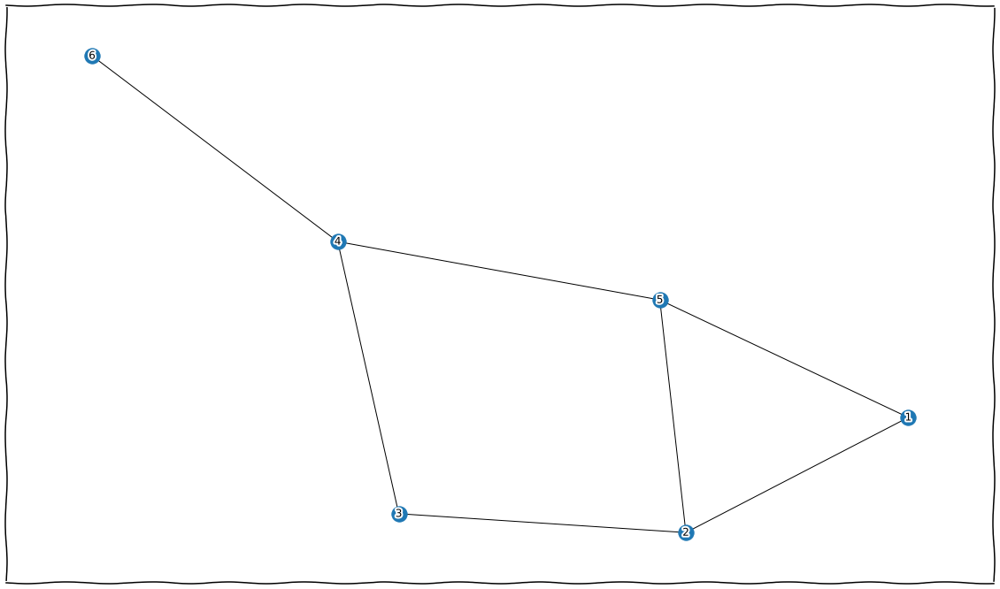

In [7]:
nx.draw_networkx(G, nx.spring_layout(G, seed=42))

### But you can give it hints/instructions

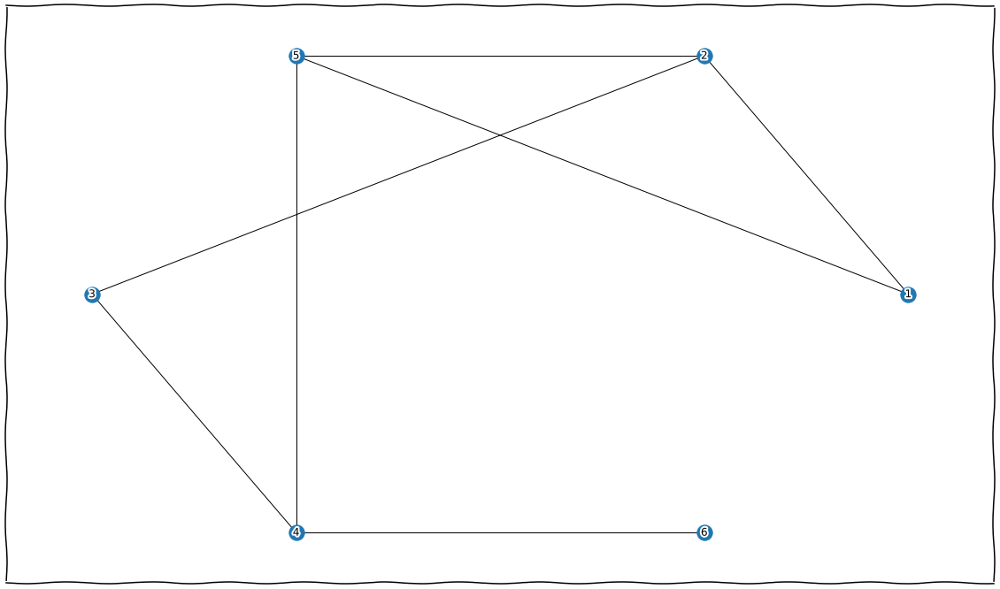

In [8]:
nx.draw_networkx(G, nx.circular_layout(G))

## Graphs can be directed or undirected
Previous example was undirected


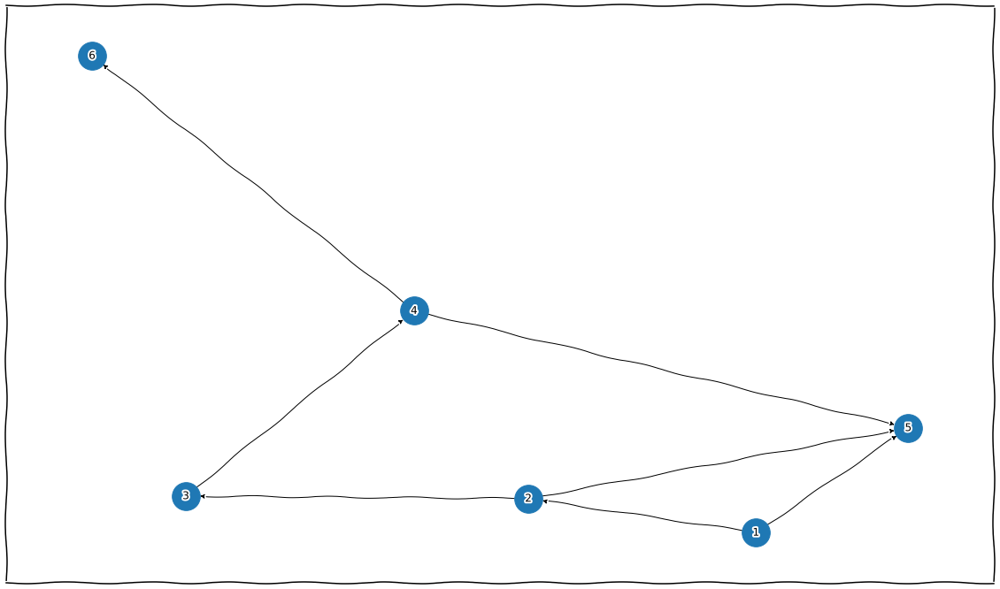

In [9]:
G = nx.DiGraph()
G.add_edges_from([(1,2),(1,5),(2,3),(2,5),(3,4),(4,5),(4,6)])
nx.draw_networkx(G, nx.spring_layout(G), node_size=1000)

## Graphs can loop!


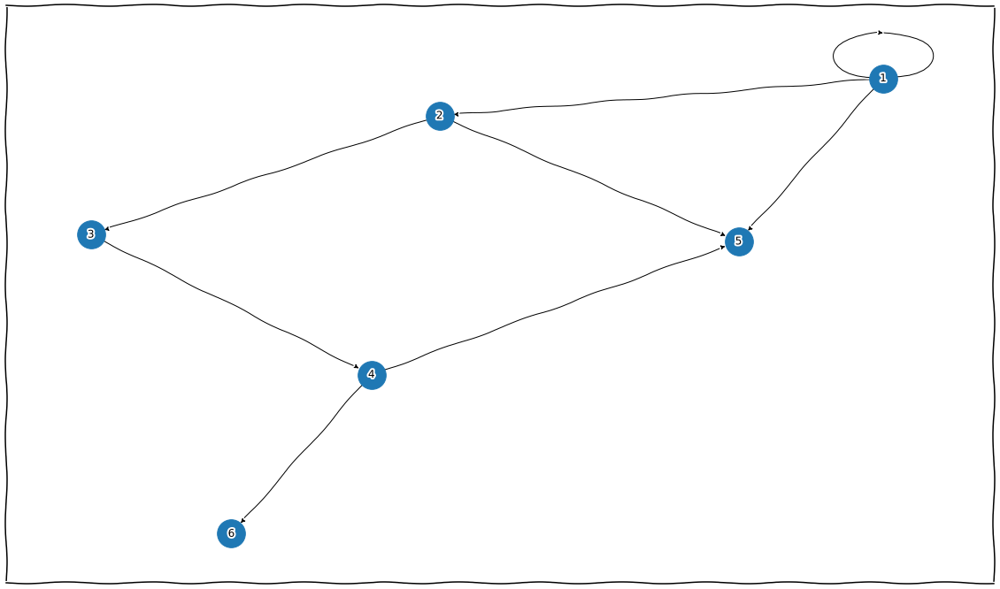

In [10]:
G = nx.DiGraph()
G.add_edges_from([(1,2),(1,5),(2,3),(2,5),(3,4),(4,5),(4,6)])
G.add_edge(1,1)
nx.draw_networkx(G, nx.kamada_kawai_layout(G), node_size=1000) # this just looks better

### Edges can have funky features

It just takes a little bit more fiddling

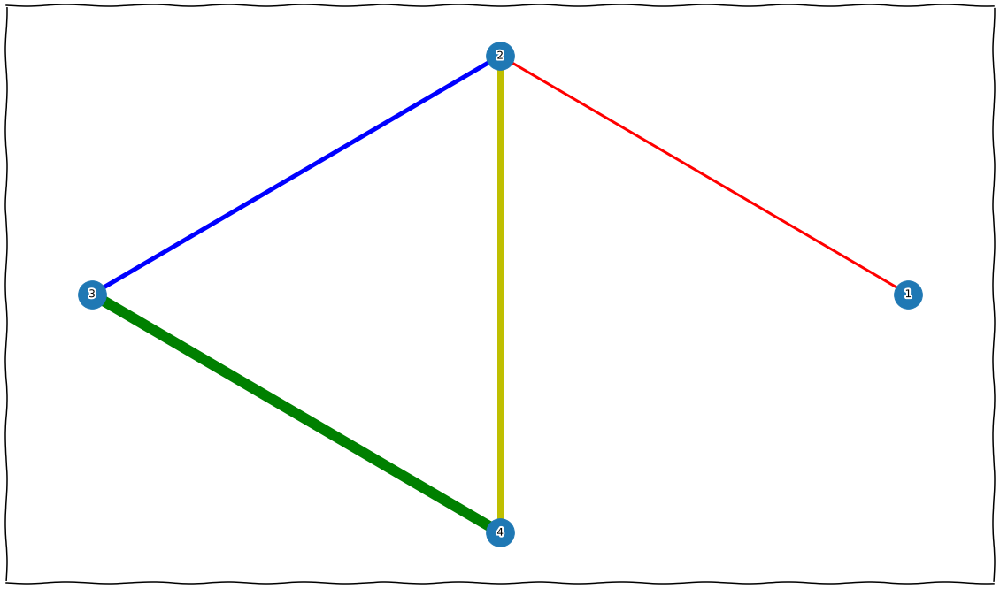

In [11]:
G = nx.Graph()
G.add_edge(1, 2, color='r' ,weight=3)
G.add_edge(2, 3, color='b', weight=5)
G.add_edge(2, 4, color='y', weight=7)
G.add_edge(3, 4, color='g', weight=12)

nx.draw_networkx(G, nx.circular_layout(G), node_size=1000,
        edge_color=list(nx.get_edge_attributes(G,'color').values()), 
        width=list(nx.get_edge_attributes(G,'weight').values()))

### Nodes don't have to be numbers/strings!

Any `hashable` object will do

(ditto edges)


In [12]:
from enum import Enum
from typing import Optional

@dataclass(frozen=True)
class Person:
    name:str
    age:int
    def __repr__(self):
        return f'{self.name}({self.age})'
        
        
class Relation(Enum):
    FRIEND = 1
    FOE = 2

In [13]:
people = [Person('Joe',79),Person('Vlad', 69),Person('Wlad', 44)]
G = nx.Graph()
G.add_nodes_from(people)
G.add_edge(people[0],people[1], object=Relation.FOE)
G.add_edge(people[0],people[2], object=Relation.FRIEND)
G.add_edge(people[1],people[2], object=Relation.FOE)

G.nodes

NodeView((Joe(79), Vlad(69), Wlad(44)))

In [14]:
for relationship in G.edges:
    print(relationship, str(G.get_edge_data(*relationship)['object']))

(Joe(79), Vlad(69)) Relation.FOE
(Joe(79), Wlad(44)) Relation.FRIEND
(Vlad(69), Wlad(44)) Relation.FOE


## Ok, but why?

Have you heard of PageRank? Back-links between 7 example websites; which is most important?

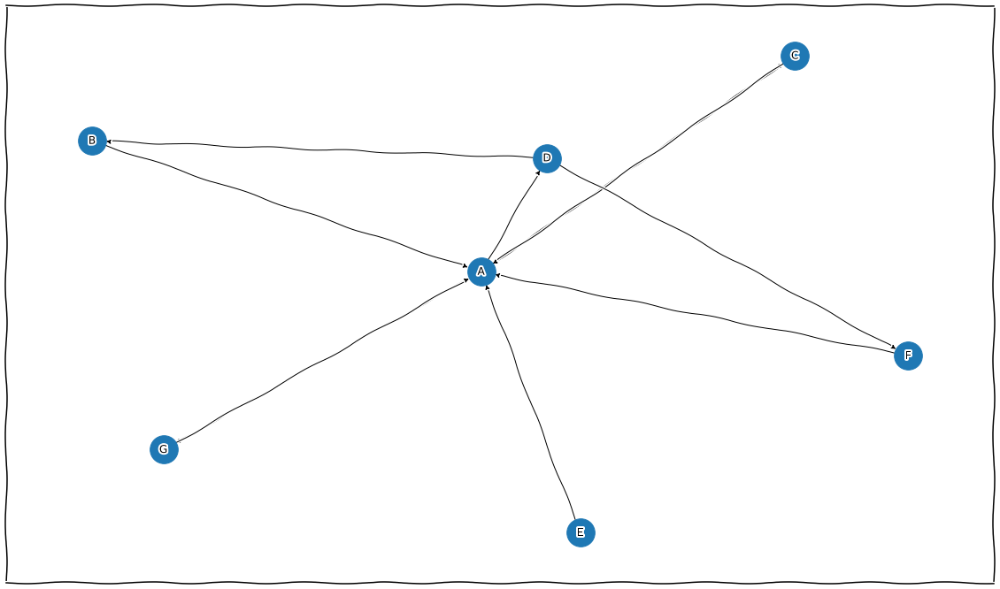

In [15]:
import networkx as nx
import pandas as pd

G = nx.DiGraph()

[G.add_node(k) for k in ["A", "B", "C", "D", "E", "F", "G"]]
G.add_edges_from([('G','A'), ('A','G'),('B','A'),('C','A'),('A','C'),('A','D'),
                  ('E','A'),('F','A'),('D','B'),('D','F')])
nx.draw_networkx(G, 
                 nx.spring_layout(G),
                 node_size=1000,
                 with_labels = True)

## Probably A, but by how much?

<AxesSubplot:title={'center':'PageRank'}>

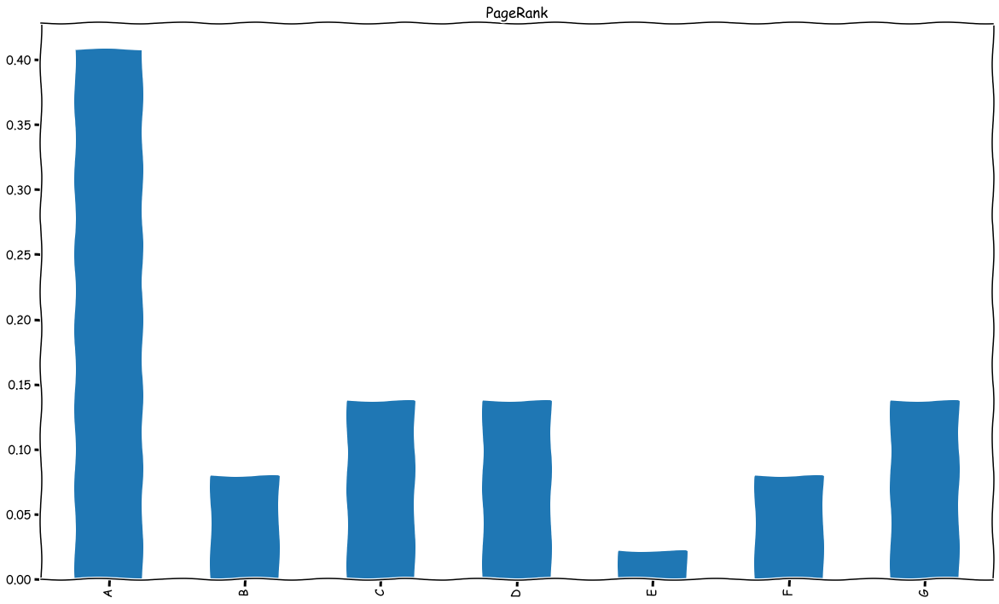

In [16]:
pr = nx.pagerank(G)
pd.Series(pr).plot.bar(title='PageRank')

## Using PR to hint for placement/display

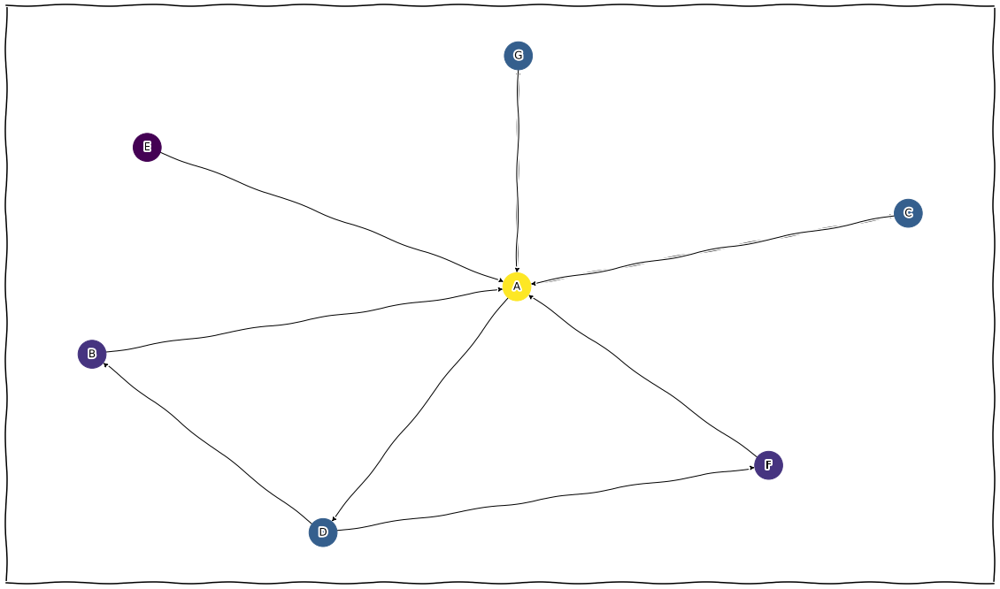

In [17]:
nx.draw_networkx(G, nx.spring_layout(G, weight=pr.values()),
                 with_labels = True, node_size=1000,
                 node_color=list(pr.values()))

## Neighbours, Commuities, Clusters and Cliques

> Zachary's karate club is a social network of a university karate club [...] The network captures 34 members of a karate club, documenting links between pairs of members who interacted outside the club.

Node 0 is the Instructor, and Node 33 is the club president (yey zero indexing)

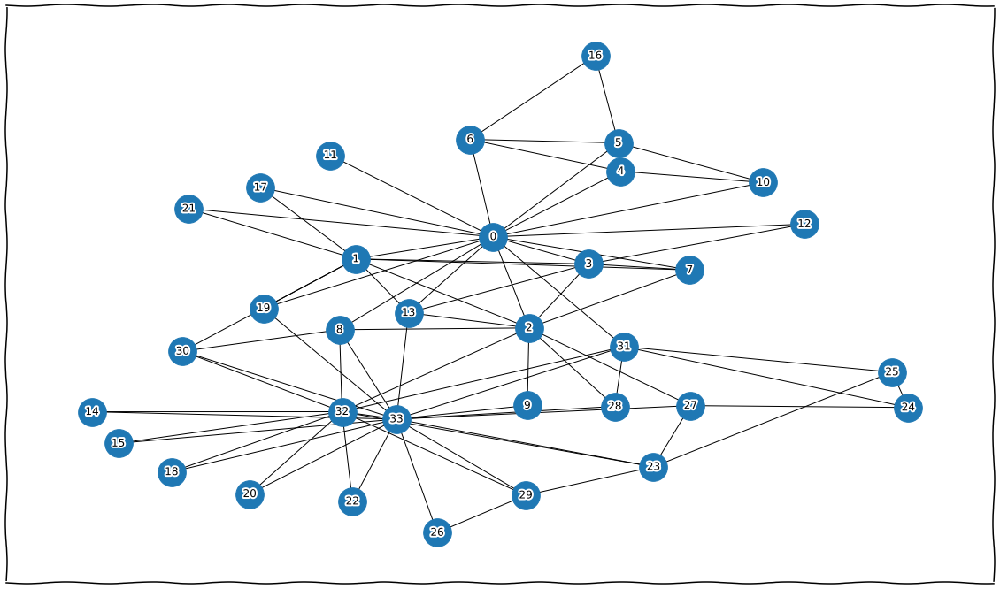

In [18]:
G=nx.karate_club_graph()
nx.draw_networkx(G,nx.kamada_kawai_layout(G), node_size=1000, with_labels=True)

## Centrality

> For every pair of vertices in a connected graph, there exists at least one shortest path between the vertices such that either the number of edges that the path passes through (for unweighted graphs) or the sum of the weights of the edges (for weighted graphs) is minimized. The betweenness centrality for each vertex is the number of these shortest paths that pass through the vertex...

...Or, my version

> How much of a pain would it be if this edge/node was removed?


### Centrality Example
Nodes at the 'edge' are less 'central'
![](https://upload.wikimedia.org/wikipedia/commons/thumb/6/60/Graph_betweenness.svg/480px-Graph_betweenness.svg.png)

### Node Centrality....

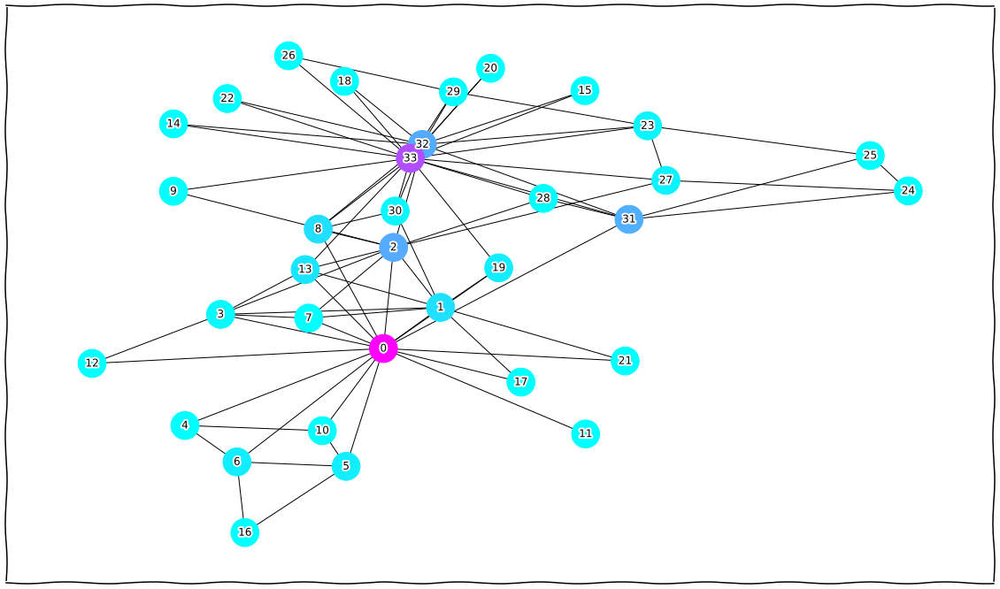

In [19]:
nx.draw_networkx(G, nx.spring_layout(G, weight=nx.betweenness_centrality(G).values()),
        with_labels = True,node_size=1000,
        node_color=list(nx.betweenness_centrality(G).values()),
        cmap=plt.cm.cool)#blue->purple

### Edge Centrality...

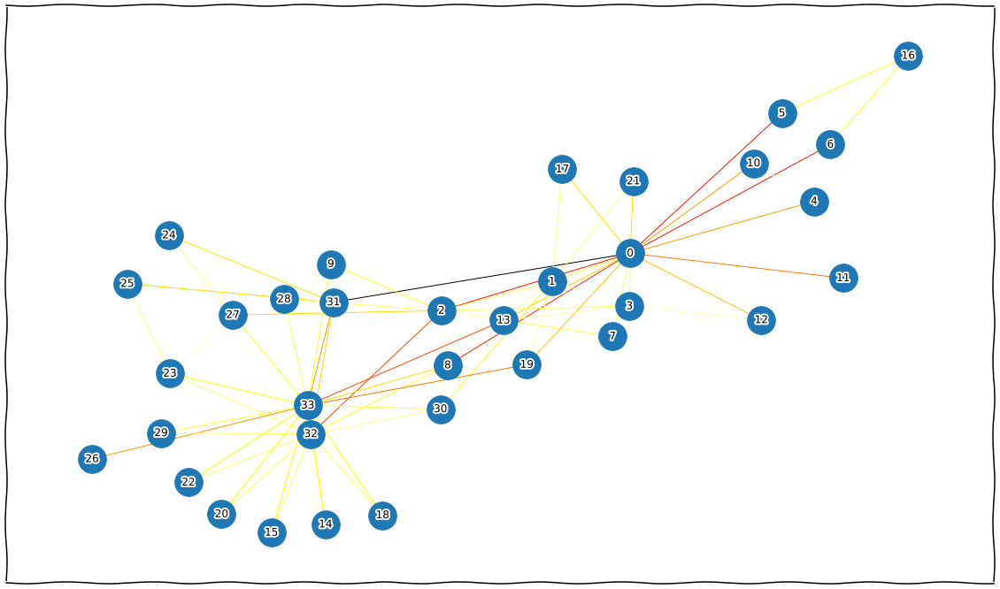

In [20]:
nx.draw_networkx(G, nx.spring_layout(G, weight=nx.betweenness_centrality(G).values()),
        with_labels = True,node_size=1000,
        edge_color=list(nx.edge_betweenness_centrality(G).values()),
        edge_cmap=plt.cm.hot_r)#Yellow->Red->Black

## But what can this tell us? 
Cliques!

Girvan-Newman algorithm finds the 'most valuable edge' (most central), removes it, and repeats until it breaks the graph into suitable 'communities'.

![](https://networkx.guide/assets/images/girvan-newman-example-one-ccbdfc6710fb745b5b36bd36e688f799.jpg)

## But what can this tell us? 
Cliques!

Girvan-Newman algorithm finds the 'most valuable edge' (most central), removes it, and repeats until it breaks the graph into suitable 'communities'.

![](https://networkx.guide/assets/images/girvan-newman-example-two-d8ba556c56b207e70825862714606287.jpg)

In [21]:
from networkx.algorithms.community.centrality import girvan_newman

G = nx.karate_club_graph()
communities = girvan_newman(G)
for iteration in communities:
    if len(iteration) > 4:
        break
    else:
        print(f'{len(iteration)} communities, of sizes {[len(c) for c in iteration]}')

2 communities, of sizes [15, 19]
3 communities, of sizes [15, 18, 1]
4 communities, of sizes [10, 18, 5, 1]


From this we can see that after cutting into two communities, you just end up with tiny 'cliques' beyond that

### What does it look like then clever clogs?
Looks to me like the coach (0) and the president (33) don't get along...

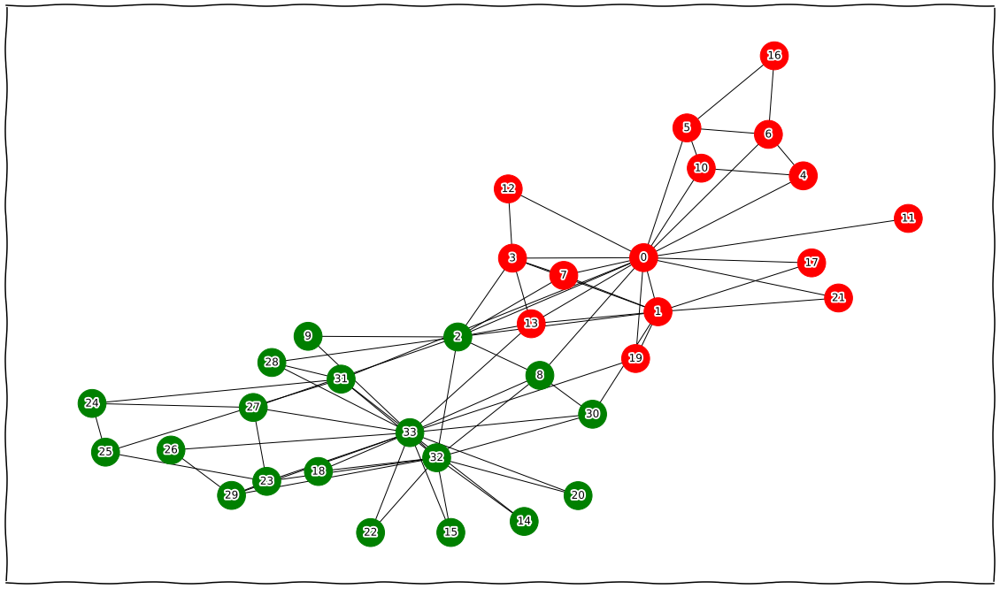

In [22]:
communities = next(girvan_newman(G))#just the first one
nx.draw_networkx(G, nx.spring_layout(G, weight=nx.betweenness_centrality(G).values()),
        with_labels = True, node_size=1000,
        node_color = [['g','r'][node in communities[0]] for node in G])

## Graph Summary

**Everything is a graph!**

![](https://i.imgflip.com/69rohn.jpg)

## What is [Open Street Map](https://www.openstreetmap.org/)

![](https://www.openstreetmap.org/assets/osm_logo-d4979005d8a03d67bbf051b4e7e6ef1b26c6a34a5cd1b65908e2947c360ca391.svg)

A Free, Editable Map of the whole world, built by over 8 Million volunteers and released with an [Open Content License](https://www.openstreetmap.org/copyright)

Consists of a network of:
* Nodes 
* Ways 
* Relations

### Nodes 
![](https://wiki.openstreetmap.org/w/images/thumb/7/76/Osm_element_node.svg/120px-Osm_element_node.svg.png)

> It consists of a single point in space defined by its latitude, longitude and node id. 



### Ways
![](https://wiki.openstreetmap.org/w/images/thumb/e/ee/Osm_element_way.svg/120px-Osm_element_way.svg.png)

>  A way normally represents a linear feature on the ground (such as a road, wall, or river). 

### Relations

![](https://wiki.openstreetmap.org/w/images/thumb/4/48/Osm_element_relation.svg/120px-Osm_element_relation.svg.png)

> It is used to define logical or geographic relationships between these different objects (for example a lake and its island, or several roads for a bus route). 

## Remind you of anything? 


![](https://arghya.xyz/images/posts/neo4j/graph_2.jpg)

It's just a graph!

## Enter OSMNX
Combination of 
* GeoPandas
* OpenStreetMap API
* **NetworkX**

### Lets start off with the simple stuff first
Plotting Geo Boundaries;

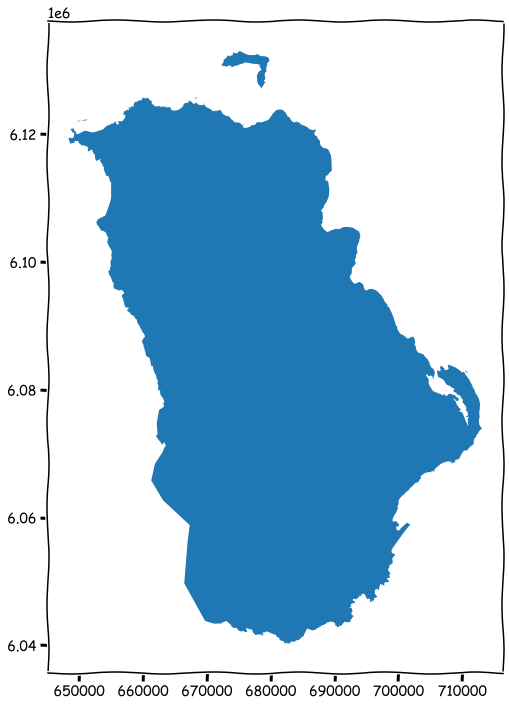

In [23]:
import osmnx as ox
area = ox.geocode_to_gdf('County Antrim, Northern Ireland')
ax = ox.project_gdf(area).plot() # gdf->'GeoDataFrame'

## So what's under the hood here?

In [24]:
ox.project_gdf(area).T

,0
geometry,"(POLYGON ((648360.629882516 6119342.555832483,..."
bbox_north,55.313086
bbox_south,54.477277
bbox_east,-5.687963
bbox_west,-6.668989
place_id,284858948
osm_type,relation
osm_id,1119534
lat,54.864726
lon,-6.143638


In [25]:
ox.project_gdf(area).T[0].geometry.area # m^2

3095315737.903886

## United Blobs
Since these are _administrative boundaries_ they don't really care about land all the time...

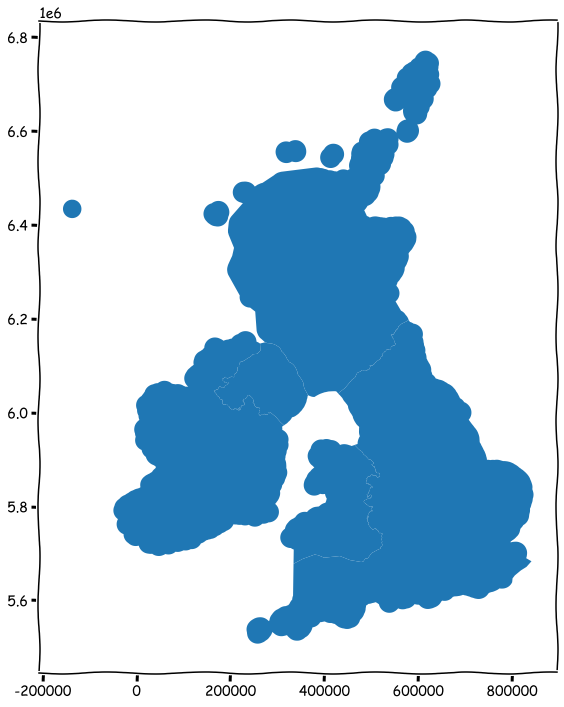

In [26]:
countries = ox.geocode_to_gdf(['Northern Ireland','Ireland','England','Scotland','Wales'])
ax = ox.project_gdf(countries).plot()

## Take it to the streets

Streets are just Nodes and Ways!

`osmnx` allows you to query for a graph of these points instead of a `GeoDataFrame`, and it's just a `networkx` Graph!

In [27]:
G = ox.graph_from_point((54.5973, -5.9301), dist=1000, dist_type='bbox', network_type="all") # Belfast
G,len(G.nodes), len(G.edges)

(<networkx.classes.multidigraph.MultiDiGraph at 0x1b584bbe0>, 2318, 5643)

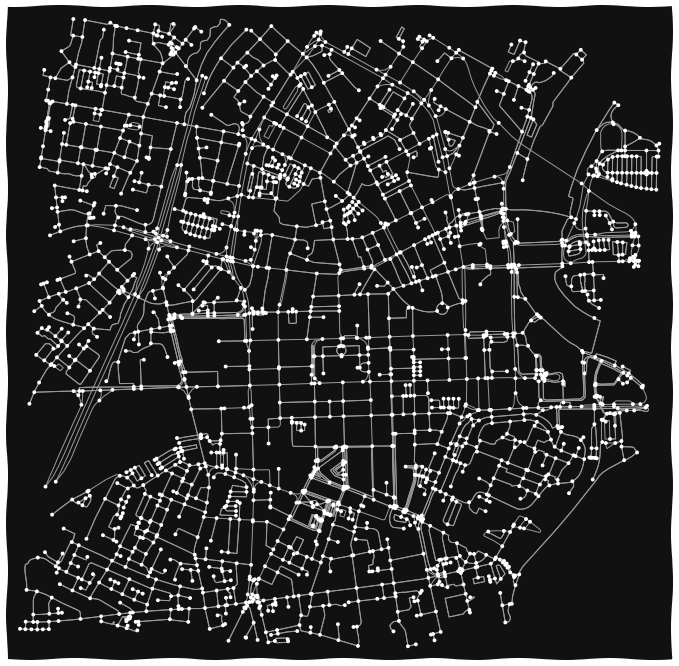

In [28]:
fig,ax = ox.plot_graph(ox.project_graph(G), figsize=figsize)

## What's that `network_type` field? 

* ‘drive’ – get drivable public streets (but not service roads)
* ‘drive_service’ – get drivable public streets, including service roads
* ‘walk’ – get all streets and paths that pedestrians can use (this network type ignores one-way directionality)
* ‘bike’ – get all streets and paths that cyclists can use
* ‘all’ – download all (non-private) OSM streets and paths
* ‘all_private’ – download all OSM streets and paths, including private-access ones


## 🚗
Get only the drivable "ways"

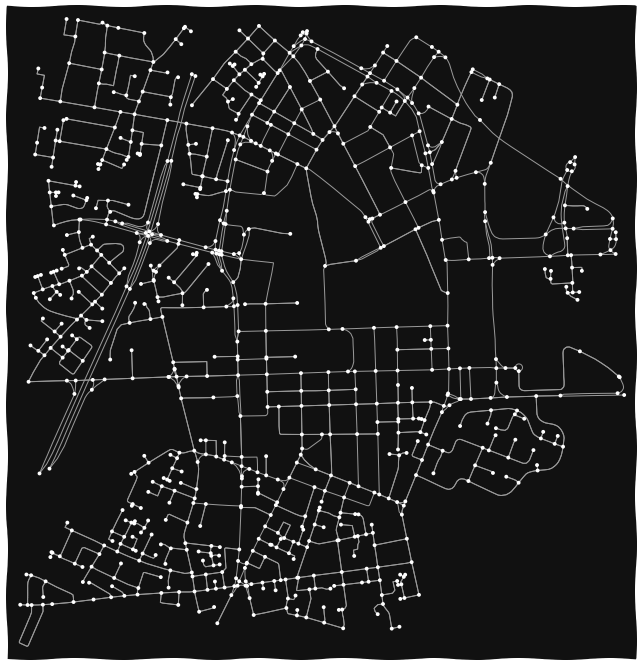

In [29]:
G=ox.graph_from_point(points['belfast'], dist=1000, dist_type='bbox', network_type="drive")
fig,ax = ox.plot_graph(ox.project_graph(G), figsize=figsize)

## What else is in there? 
(Notice we're back to `all` again!)

In [30]:

from functools import partial
def edge_df(G):
    edges = []
    for u, v, key, data in G.edges(keys=True, data=True):
        edge = dict(u=u, v=v, key=key)
        edge.update(data)
        edges.append(edge)
    return pd.DataFrame.from_records(edges)

def node_df(G):
    nodes = []
    for key,data in G.nodes(data=True):
        node = dict(key=key)
        node.update(data)
        nodes.append(node)
    return pd.DataFrame.from_records(nodes)

def un_listify(value, sentinel):
    if isinstance(value,list):
        return sentinel in value
    else:
        return sentinel == value

In [31]:
G=ox.graph_from_point(points['belfast'], dist=1000, dist_type='bbox', network_type="all")
df = edge_df(G) # this is hidden; checkout the notebook!
df.head()

,u,v,key,osmid,ref,name,highway,maxspeed,oneway,length,geometry,lanes,access,bridge,width,service,tunnel,junction,area
0,351599,351600,0,5209408,B503,Sandy Row,secondary,30 mph,False,68.019,"LINESTRING (-5.9369028 54.5913308, -5.9366651 ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,351599,1121792828,0,5209408,B503,Sandy Row,secondary,30 mph,False,58.732,"LINESTRING (-5.9369028 54.5913308, -5.9370089 ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,351599,455032602,0,38485621,NaN,NaN,residential,NaN,False,89.353,"LINESTRING (-5.9369028 54.5913308, -5.937854 5...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,351600,231772694,0,5209408,B503,Sandy Row,secondary,30 mph,False,16.131,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,351600,351599,0,5209408,B503,Sandy Row,secondary,30 mph,False,68.019,"LINESTRING (-5.9366385 54.591923, -5.9366651 5...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [32]:
df.highway.value_counts()

service                                 1468
residential                              934
footway                                  862
unclassified                             553
primary                                  399
tertiary                                 248
path                                     236
pedestrian                               206
secondary                                205
cycleway                                 126
living_street                             72
[footway, residential]                    64
trunk_link                                33
[footway, steps]                          24
steps                                     20
[unclassified, service]                   18
[footway, service]                        18
secondary_link                            18
tertiary_link                             11
[path, residential]                       10
motorway_link                              9
[footway, corridor]                        8
trunk     

## Lets make a mess of this dataframe!
Un-listify these `highway` types... and other mess that you'll have to check out the notebook to review!

In [33]:
highway_types = Counter()
for hw in df.highway.values:
    if isinstance(hw, list):
        highway_types.update(hw)
    else:
        highway_types[hw]+=1
        
for hw in highway_types:
    df[f'is_{hw}']=df.highway.apply(partial(un_listify, sentinel=hw))
    
highway_types.most_common(5)

[('service', 1518),
 ('residential', 1028),
 ('footway', 1008),
 ('unclassified', 583),
 ('primary', 399)]

## Paint me a picture
So... where are the actual dedicated `cycleway`s in Belfast?

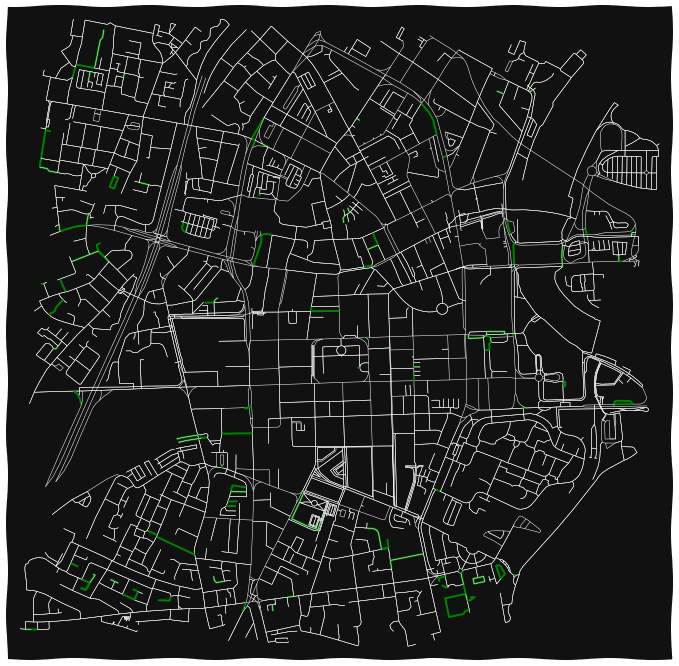

In [34]:
fig, ax=ox.plot_graph(ox.project_graph(G),
             edge_color=df.is_cycleway.apply(lambda hw: ['w','g'][hw]),
             edge_linewidth=df.is_cycleway.apply(lambda hw: [0.5,2][hw]),
             node_size=0, figsize=figsize
)

## Back to graph stuff
Where are the most connected (i.e. central, i.e. 'critical') junctions in/around belfast?)

(Just using the `drive` network now...), and this time with a much bigger map!
(Be careful if you're doing this at home; it's a chonky boi)

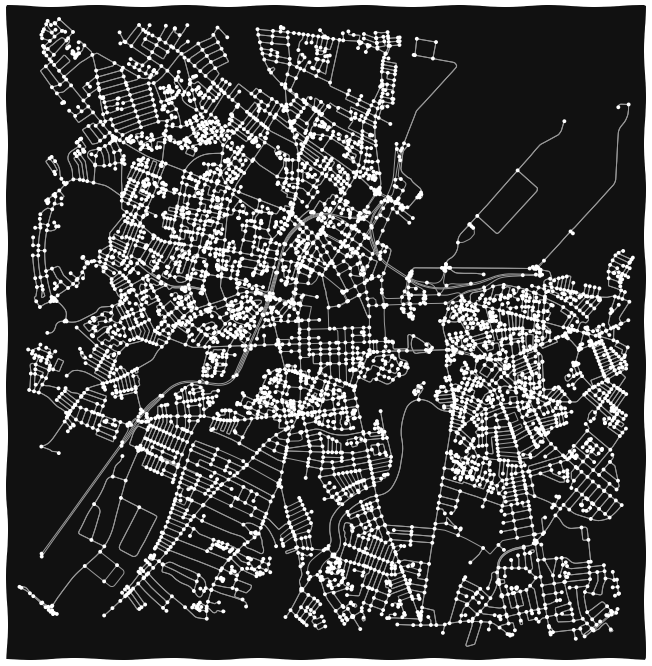

In [35]:
G=ox.graph_from_point(points['belfast'], dist=3_000, dist_type='bbox', network_type="drive", simplify=True)
fig, ax=ox.plot_graph(ox.project_graph(G), figsize=figsize)

In [36]:
df_n = node_df(G)
df_e = edge_df(G)
for hw in highway_types:
    df_e[f'is_{hw}']=df_e.highway.apply(partial(un_listify, sentinel=hw))

In [37]:
df_e.highway.value_counts()

residential                     8157
tertiary                        1217
primary                         1138
secondary                        740
unclassified                     656
living_street                    388
trunk                             56
trunk_link                        52
secondary_link                    38
[living_street, residential]      30
motorway_link                     25
tertiary_link                     23
primary_link                      17
motorway                          12
[unclassified, residential]        8
[unclassified, primary]            1
Name: highway, dtype: int64

In [38]:
centrality = nx.betweenness_centrality(nx.DiGraph(G),weight='length') # This is the expensive boi!
df_n['centrality'] = df_n['key'].apply(centrality.get)

In [39]:
norm = colors.Normalize(vmin=df_n['centrality'].min(), vmax=df_n['centrality'].max())

centrality_size = df_n['centrality'].apply(norm)*128
centrality_colors = df_n['centrality'].apply(norm).apply(cmap).values

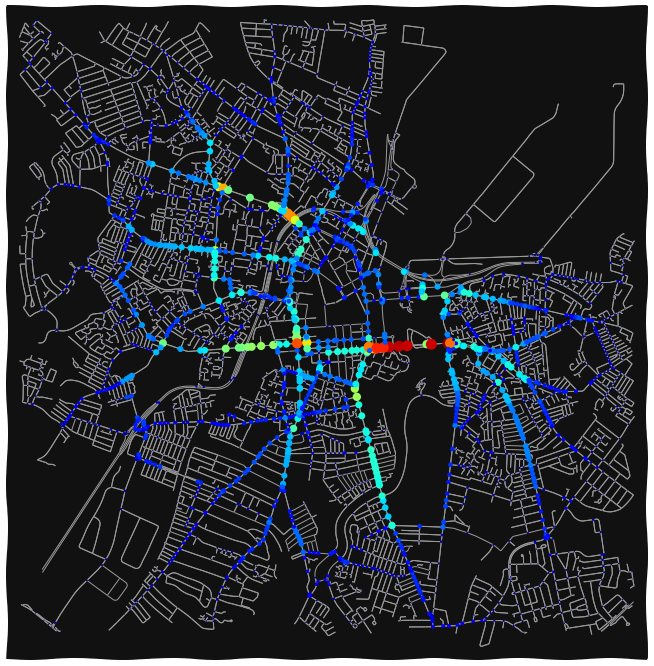

In [40]:
fig, ax=ox.plot_graph(G, node_size=centrality_size, node_color=centrality_colors, figsize=figsize)

## The big Cahuna
* Road Widths actually represented by number of lanes
* Edge Colouring by Highway type
* Node Coloring and Size on Centrality

(See the notebook for the dirt...)


In [41]:
G=ox.graph_from_point(points['belfast'], dist=3_000, dist_type='bbox', network_type="drive")

df_n = node_df(G)
df_e = edge_df(G)

df_e['lanes'] = df_e['lanes'].apply(lambda l: max(map(float,l)) if isinstance(l,list) else float(l))

highway_types = Counter()
for hw in df_e.highway.values:
    if isinstance(hw, list):
        highway_types.update(hw)
    else:
        highway_types[hw]+=1

for hw in highway_types:
    df_e[f'is_{hw}']=df_e.highway.apply(partial(un_listify, sentinel=hw))
    
highway_counter = Counter()
highway_counter.update(df_e[df_e['highway'].apply(lambda o: not isinstance(o,list))]['highway'].values)
highway_counter.update([i for l in df_e[df_e['highway'].apply(lambda o:isinstance(o,list))]['highway'].values for i in l])

cmap=plt.cm.get_cmap('Paired', len(highway_counter))

highway_colourmap = {}
for (k,v),c in zip(highway_counter.most_common(),cmap.colors):
    highway_colourmap[k]=c
    
display_width = df_e[['lanes']].sum(axis=1).fillna(1.0)+1

highway_color = df_e['highway'].apply(lambda h: highway_colourmap[h[0]] 
                                      if isinstance(h,list) else highway_colourmap[h])

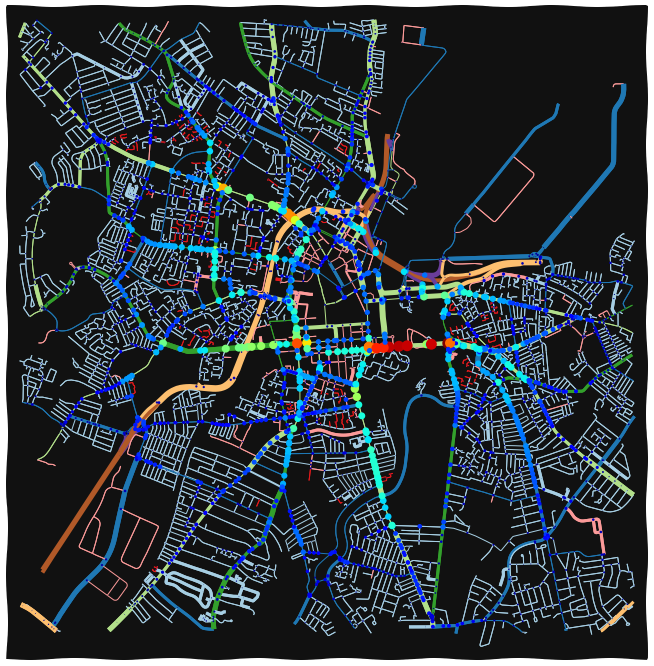

In [42]:
fig, ax = ox.plot_graph(G, figsize=figsize,
                        edge_color=highway_color, 
                        edge_linewidth=display_width,
                        node_size=centrality_size, node_color=centrality_colors
)

## Walking the graph
Get real world 'shortest path' distance from one point to another

In [43]:
nx.astar_path(G, source=np.random.choice(G.nodes),target=np.random.choice(G.nodes))

[4364404029,
 1504128491,
 454344701,
 194650703,
 454345829,
 2506508993,
 121124115,
 4364402764,
 1620170122,
 454457713,
 3023566809,
 2539901785,
 3023566811,
 18402534,
 451734713,
 1248465716,
 194663060,
 194661205,
 194661353,
 451735725,
 451735667,
 451735884,
 86177064,
 1652026964,
 3024333858,
 3024333855,
 3024333849,
 452411824,
 3024333871,
 85463451,
 85463454,
 86176721,
 452414870,
 452416709,
 452416667,
 85463457,
 3027380820,
 3027380805]

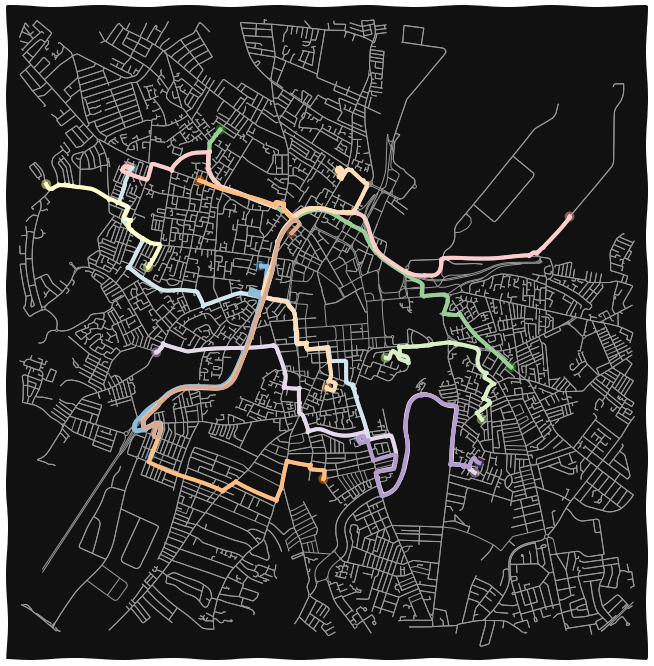

In [44]:
routes = []
while len(routes)<=10:
    try: 
        routes.append(nx.astar_path(G, source=np.random.choice(G.nodes),target=np.random.choice(G.nodes)))
    except nx.NetworkXNoPath: # Since this isn't a fully connected graph, not all nodes are traversable!
        continue
fig,ax = ox.plot_graph_routes(G, routes, figsize=figsize,
                              route_colors=mpl.cm.get_cmap('Paired', len(routes)).colors, node_size=0)

In [45]:
center_node = np.random.choice(G.nodes)
path_lengths = nx.single_source_dijkstra_path_length(G, center_node, weight='length')
df_n['distance'] = df_n['key'].apply(path_lengths.get)
norm = colors.Normalize(vmin=df_n['distance'].min(), vmax=df_n['distance'].max())
distance_colours = df_n['distance'].apply(norm).apply(plt.cm.get_cmap('jet_r')).values


/var/folders/x0/g5jscmmd6qgbf6x4k83xvslm0000gp/T/ipykernel_73260/1444829817.py:2: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  node_size = [[10,500][node==center_node] for node in G.nodes])


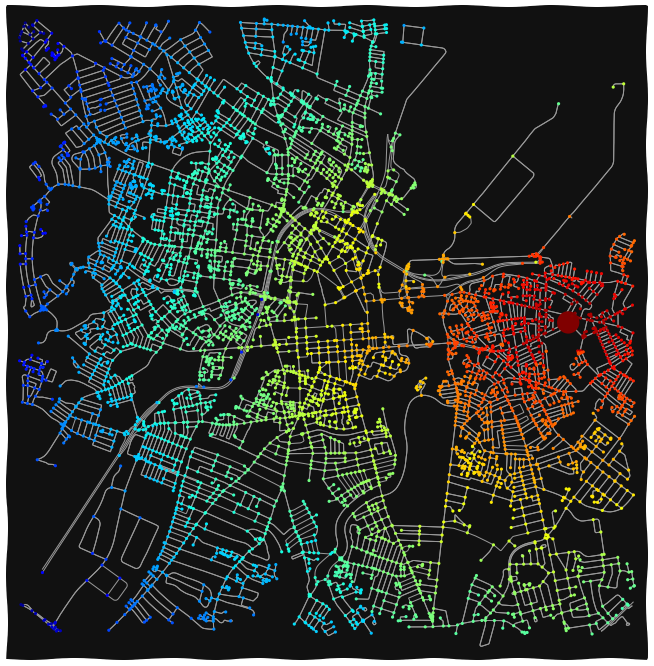

In [46]:
fig,ax = ox.plot_graph(G, node_color=distance_colours, figsize=figsize, 
                       node_size = [[10,500][node==center_node] for node in G.nodes])

## Create a walking distance map with isochrones

Subdivide graphs into regions of walkability

In [47]:
# add an edge attribute for time in minutes required to traverse each edge
trip_times = [ 10, 15, 30, 45] #in minutes
travel_speed = 5 #walking speed in km/hour
meters_per_minute = travel_speed * 1000 / 60 #km per hour to m per minute
for u, v, k, data in G.edges(data=True, keys=True):
    data['time'] = data['length'] / meters_per_minute

In [48]:
# make the isochrone polygons
isochrone_polys = []
for trip_time in sorted(trip_times, reverse=True):
    subgraph = nx.ego_graph(G, center_node, radius=trip_time, distance='time')
    node_points = [Point((data['x'], data['y'])) for node, data in subgraph.nodes(data=True)]
    bounding_poly = gpd.GeoSeries(node_points).unary_union.convex_hull
    isochrone_polys.append(bounding_poly)

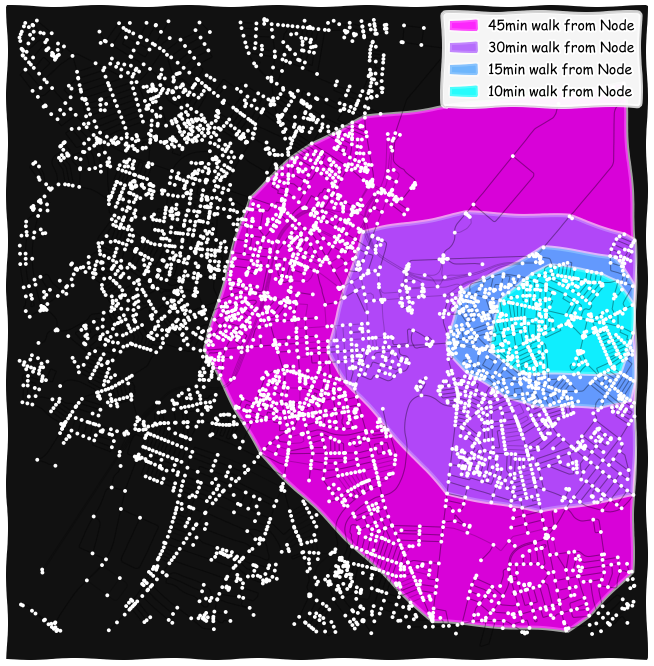

In [49]:
# plot the network then add isochrones as colored descartes polygon patches
from descartes import PolygonPatch
fig, ax = ox.plot_graph(G, show=False, close=False, edge_color='k', edge_alpha=0.2, figsize=figsize)


norm = colors.LogNorm(vmin=min(trip_times), vmax=max(trip_times))
cmap=plt.cm.get_cmap('cool', len(trip_times))

handles = []

labels=[]
for polygon, trip_time in zip(isochrone_polys, reversed(trip_times)):
    patch = PolygonPatch(polygon, fc=cmap(norm(trip_time)), ec='none', alpha=0.6, zorder=-1, label="{}min walk from Node".format(trip_time))
    ax.add_patch(patch)
    handles.append(patch)
_=plt.legend(handles=handles)

## More than just nodes; Bearings

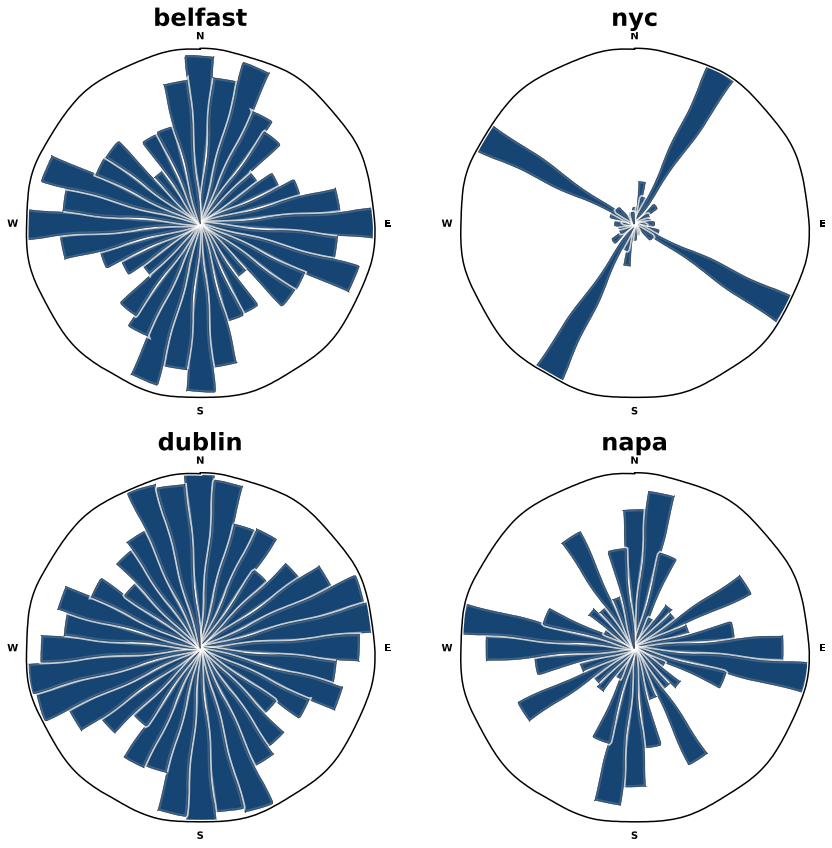

In [50]:
n = len(points)
ncols = int(np.ceil(np.sqrt(n)))
nrows = int(np.ceil(n / ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=figsize, subplot_kw={"projection": "polar"})

for ax,(place,coords) in zip(axes.flat,points.items()):
    G = ox.graph_from_point(coords,dist=1000, dist_type='bbox', network_type='drive')
    Gu = ox.add_edge_bearings(ox.get_undirected(G))
    fig,ax = ox.plot_orientation(Gu, title=place, area=True, ax=ax)

# What can you do with this? 

Designed Hoodies for WhiteHat Security

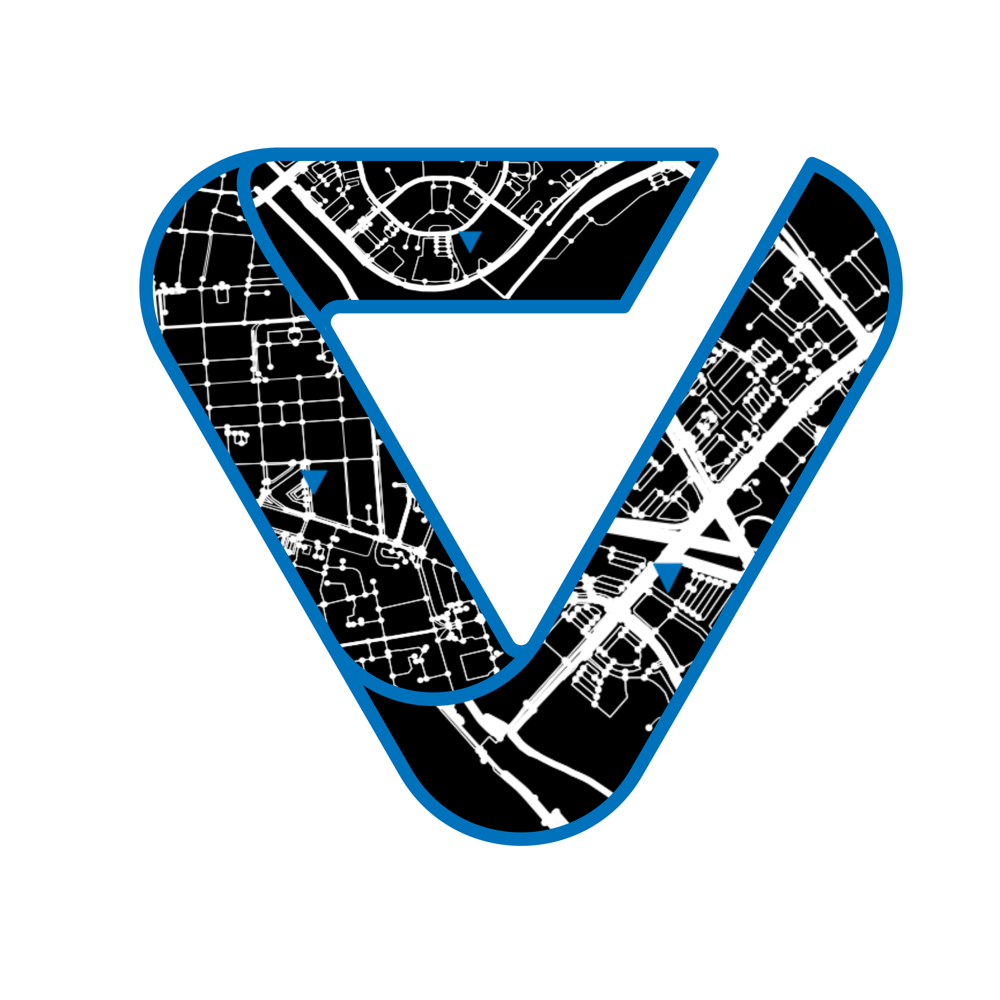

In [51]:
Image('vantage_hoodie_bolster.png')

## Laser Cutting

Using [Farset Labs](https://www.farsetlabs.org.uk) awesome GlowForge laser cutter!

(Also thanks to AlertLogic for "donating" the plastic... kinda...)

In [52]:
youtube_video('xD0mwsZcI0A').display()

## Sold Pillows on Redbubble!

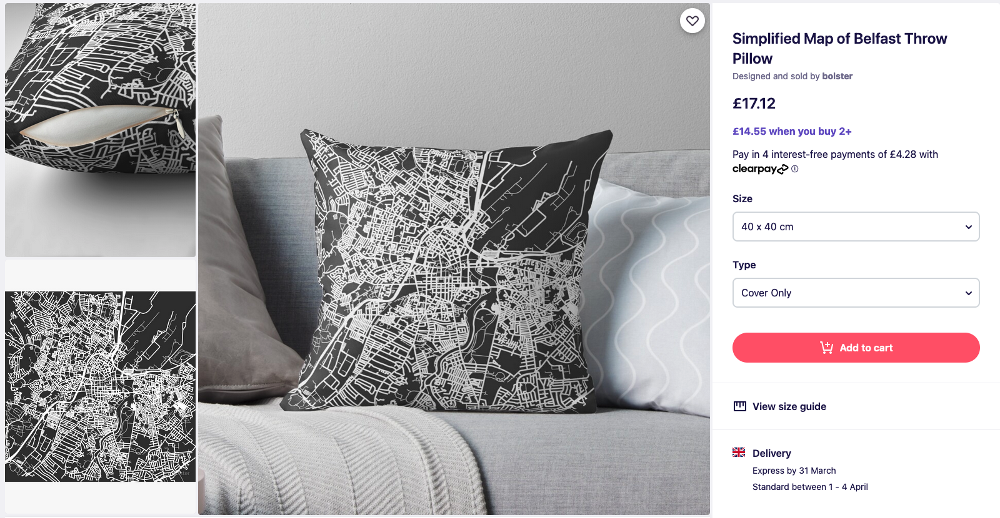

In [53]:
Image('redbubble.png')

## Recommended Links

* [Networkx.guide](https://networkx.guide)
* [OSMNX Examples](https://github.com/gboeing/osmnx-examples)
